In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.image import imread
import os

# Please check respective markdown cells for derivations 

# Question 1

## a) Data Representation

In [168]:
train_data=[]

# Loading data from source
for i in os.listdir('face_data/train/'):
    if i!='.ipynb_checkpoints':
        train_data.append(imread('face_data/train/' + i).reshape(-1,1))
        
l, b = imread('face_data/train/' + i).shape


# Converting list to numpy array
train_data=np.array(train_data, dtype=np.float32).squeeze(2).T
# normalising data for pca
train_data/=255

## b) Mean Centering and Covariance Matrix

In [169]:
mean_face         = np.mean(train_data, axis=1).reshape(-1,1)
covariance_face   = (mean_face@mean_face.T)*(1/train_data.shape[1])
mean_centred_face = train_data-mean_face 

## c) PCA Eigenvalue Problem

### a) Eigenvalue Problem (State the eigenvalue problem for the covariance matrix, defining the eigenvectors and eigenvalues)

In [170]:
# using eigh instead of eig as covariance matrix is symmetric
eig_face_1 = np.linalg.eigh(covariance_face)

# Getting indices for descending order sort
sort_ind_1    = eig_face_1[0].argsort()[::-1]

eigval_face_1 = eig_face_1[0][sort_ind_1]
eigvec_face_1 = eig_face_1[1][:, sort_ind_1]

### b) Variance Interpretation

Let $\mathbf{X}$ be the data matrix: $(n \times d)$
* $n$ = number of samples (rows, $\mathbf{x}_i^T$)
* $d$ = number of features (columns)

Let $\mathbf{w}$ be the direction vector: $(d \times 1)$
* Constraint: $\mathbf{w}^T \mathbf{w} = 1$

Projected data $\mathbf{z}$: $(n \times 1)$
* $z_i = \mathbf{x}_i^T \mathbf{w}$ (scalar projection for sample $i$)

Mean of original features $\mathbf{\mu}_x$: $(d \times 1)$
$$
\mathbf{\mu}_x = \frac{1}{n} \sum_{i=1}^{n} \mathbf{x}_i
$$
* $\mathbf{x}_i$ is the $i$-th sample, treated as a $(d \times 1)$ column vector.

Mean of projected data $\mu_z$: (scalar, $1 \times 1$)
$$
\mu_z = \frac{1}{n} \sum_{i=1}^{n} z_i = \frac{1}{n} \sum_{i=1}^{n} (\mathbf{x}_i^T \mathbf{w})
$$
* Since $\mathbf{w}$ is a constant, we can move it out:
$$
\mu_z = \left( \frac{1}{n} \sum_{i=1}^{n} \mathbf{x}_i^T \right) \mathbf{w}
$$
* The term in parenthesis is $\mathbf{\mu}_x^T$, a $(1 \times d)$ row vector.
$$
\mu_z = \mathbf{\mu}_x^T \mathbf{w}
$$
* Dimensions: $(1 \times d) \cdot (d \times 1) = (1 \times 1)$ scalar.

Variance of projected data $\text{Var}(\mathbf{z})$:
$$
\text{Var}(\mathbf{z}) = \frac{1}{n} \sum_{i=1}^{n} (z_i - \mu_z)^2
$$
Substitute $z_i = \mathbf{x}_i^T \mathbf{w}$ and $\mu_z = \mathbf{\mu}_x^T \mathbf{w}$:
$$
= \frac{1}{n} \sum_{i=1}^{n} (\mathbf{x}_i^T \mathbf{w} - \mathbf{\mu}_x^T \mathbf{w})^2
$$
$$
= \frac{1}{n} \sum_{i=1}^{n} ((\mathbf{x}_i - \mathbf{\mu}_x)^T \mathbf{w})^2
$$
Since $(\mathbf{a}^T \mathbf{b})^2 = (\mathbf{a}^T \mathbf{b})(\mathbf{a}^T \mathbf{b}) = \mathbf{b}^T (\mathbf{a} \mathbf{a}^T) \mathbf{b}$:
$$
= \frac{1}{n} \sum_{i=1}^{n} \mathbf{w}^T (\mathbf{x}_i - \mathbf{\mu}_x) (\mathbf{x}_i - \mathbf{\mu}_x)^T \mathbf{w}
$$
Move $\mathbf{w}^T$ and $\mathbf{w}$ outside the summation:
$$
= \mathbf{w}^T \left( \frac{1}{n} \sum_{i=1}^{n} (\mathbf{x}_i - \mathbf{\mu}_x) (\mathbf{x}_i - \mathbf{\mu}_x)^T \right) \mathbf{w}
$$

Let $\mathbf{S} = \frac{1}{n} \sum_{i=1}^{n} (\mathbf{x}_i - \mathbf{\mu}_x) (\mathbf{x}_i - \mathbf{\mu}_x)^T$.
* $\mathbf{S}$ is the Covariance Matrix.
* $(\mathbf{x}_i - \mathbf{\mu}_x)$ is $(d \times 1)$, so the outer product is $(d \times 1) \cdot (1 \times d) = (d \times d)$.
* $\mathbf{S}$ is $(d \times d)$.

The variance is $\text{Var}(\mathbf{z}) = \mathbf{w}^T \mathbf{S} \mathbf{w}$.
* Dimensions: $(1 \times d) \cdot (d \times d) \cdot (d \times 1) = (1 \times 1)$ scalar.

We want to maximize the variance $\mathbf{w}^T \mathbf{S} \mathbf{w}$ subject to the constraint $\mathbf{w}^T \mathbf{w} = 1$. The constraint is necessary because without it, the variance could be made infinitely large simply by increasing the magnitude of $\mathbf{w}$. We only care about the *direction*.

**Lagrange Multipliers** are used to constraint optimisation problems
$$
\mathcal{L}(\mathbf{w}, \lambda) = \mathbf{w}^T \mathbf{S} \mathbf{w} - \lambda (\mathbf{w}^T \mathbf{w} - 1)
$$
Set derivative w.r.t. $\mathbf{w}$ to zero:
$$
\frac{\partial \mathcal{L}}{\partial \mathbf{w}} = 2 \mathbf{S} \mathbf{w} - 2 \lambda \mathbf{w} = \mathbf{0}
$$
* $\mathbf{0}$ is a $(d \times 1)$ zero vector.
$$
\mathbf{S} \mathbf{w} = \lambda \mathbf{w}
$$
* This is the eigenvector equation for $\mathbf{S}$ ($(d \times d)$ matrix).
* $\mathbf{w}$ is an eigenvector $(d \times 1)$.
* $\lambda$ is a scalar eigenvalue.

Substitute back into the variance formula:
$$
\text{Var}(\mathbf{z}) = \mathbf{w}^T \mathbf{S} \mathbf{w} = \mathbf{w}^T (\lambda \mathbf{w}) = \lambda (\mathbf{w}^T \mathbf{w})
$$
Since $\mathbf{w}^T \mathbf{w} = 1$:
$$
\text{Var}(\mathbf{z}) = \lambda
$$
To maximize variance, $\mathbf{w}_1$ must be the eigenvector of $\mathbf{S}$ with the largest eigenvalue $\lambda_1$. This is the **first principal component**.

To find the new basis of $k$ dimensions, this process is repeated. The second principal component, $\mathbf{w}_2$, is found by maximizing the variance in a direction orthogonal to $\mathbf{w}_1$, which corresponds to the eigenvector with the second-largest eigenvalue, $\lambda_2$. This is repeated $k$ times to find the $k$ eigenvectors (principal components) corresponding to the $k$ largest eigenvalues. These $k$ vectors form the new, lower-dimensional basis.

### c) Dimensionality Reduction: Briefly explain how selecting the top-K eigenvectors enables dimensionality reduction while preserving the most important data features.

#### We look for dimensions which are effectively less in number than original dimension of data
#### This means we are searching for basis which is compact and describes the data good enough than previous dimensions of the data
#### First the number of dimensions are reduced from d to k (d > k)
#### These k dimensions are the ones with most variance (top k eigenvectors from the covariance matrix of data)
#### From the derivation above, its clear that dominant eigenvectors capture more variance in projected data

## d) Projection and Reconstruction in PCA Subspace

### a)

* $\mathbf{x}$: Original data point (e.g., test image) $(d \times 1)$
* $\mathbf{\mu}_x$: Mean vector of training data (e.g., "mean face") $(d \times 1)$
* $\mathbf{W}$: Matrix of $k$ principal components (eigenvectors $\mathbf{w}_j$) $(d \times k)$
* $\mathbf{z}$: Low-dimensional feature vector $(k \times 1)$
* $\tilde{\mathbf{x}}$: Reconstructed data point $(d \times 1)$


From the maximum variance derivation, the optimal basis vectors $\mathbf{W}$ are the eigenvectors of the covariance matrix $\mathbf{S}$. To project $\mathbf{x}$ onto this basis, we first center the vector and then multiply by $\mathbf{W}^T$.

$$
\mathbf{z} = \mathbf{W}^T (\mathbf{x} - \mathbf{\mu}_x)
$$
* **Dimensions:** $(k \times 1) = (k \times d) \cdot (d \times 1)$

This vector $\mathbf{z}$ is the low-dimensional representation of $\mathbf{x}$.


The goal is to find an approximation $\tilde{\mathbf{x}}$ of $\mathbf{x}$ using only the low-dimensional vector $\mathbf{z}$.

We define $\tilde{\mathbf{x}}$ as a linear combination of the $k$ principal components, weighted by $\mathbf{z}$, and then add the mean back.
$$
\tilde{\mathbf{x}}(\mathbf{z}) = \mathbf{W} \mathbf{z} + \mathbf{\mu}_x
$$
* **Dimensions:** $(d \times 1) = (d \times k) \cdot (k \times 1) + (d \times 1)$


$$
J(\mathbf{z}) = ||\mathbf{x} - \tilde{\mathbf{x}}||^2
$$

$$
J(\mathbf{z}) = ||\mathbf{x} - (\mathbf{W} \mathbf{z} + \mathbf{\mu}_x)||^2
$$
$$
J(\mathbf{z}) = ||(\mathbf{x} - \mathbf{\mu}_x) - \mathbf{W} \mathbf{z}||^2
$$
Let $\mathbf{y} = \mathbf{x} - \mathbf{\mu}_x$. We minimize $J = ||\mathbf{y} - \mathbf{W} \mathbf{z}||^2$ w.r.t. $\mathbf{z}$.
$$
J = (\mathbf{y} - \mathbf{W} \mathbf{z})^T (\mathbf{y} - \mathbf{W} \mathbf{z})
$$
$$
J = (\mathbf{y}^T - \mathbf{z}^T \mathbf{W}^T) (\mathbf{y} - \mathbf{W} \mathbf{z})
$$
$$
J = \mathbf{y}^T \mathbf{y} - \mathbf{y}^T \mathbf{W} \mathbf{z} - \mathbf{z}^T \mathbf{W}^T \mathbf{y} + \mathbf{z}^T \mathbf{W}^T \mathbf{W} \mathbf{z}
$$
Since $\mathbf{y}^T \mathbf{W} \mathbf{z}$ is a scalar, its transpose is equal: $(\mathbf{y}^T \mathbf{W} \mathbf{z})^T = \mathbf{z}^T \mathbf{W}^T \mathbf{y}$.
$$
J = \mathbf{y}^T \mathbf{y} - 2 \mathbf{z}^T \mathbf{W}^T \mathbf{y} + \mathbf{z}^T \mathbf{W}^T \mathbf{W} \mathbf{z}
$$
The columns of $\mathbf{W}$ are orthonormal eigenvectors, so $\mathbf{W}^T \mathbf{W} = \mathbf{I}_k$ (the $k \times k$ identity matrix).
$$
J = \mathbf{y}^T \mathbf{y} - 2 \mathbf{z}^T \mathbf{W}^T \mathbf{y} + \mathbf{z}^T \mathbf{I}_k \mathbf{z}
$$
$$
J = \mathbf{y}^T \mathbf{y} - 2 \mathbf{z}^T (\mathbf{W}^T \mathbf{y}) + \mathbf{z}^T \mathbf{z}
$$
To minimize $J$, we take the derivative w.r.t. $\mathbf{z}$ and set to zero:
$$
\frac{\partial J}{\partial \mathbf{z}} = -2 \mathbf{W}^T \mathbf{y} + 2 \mathbf{z} = \mathbf{0}
$$
$$
2 \mathbf{z} = 2 \mathbf{W}^T \mathbf{y}
$$
$$
\mathbf{z} = \mathbf{W}^T \mathbf{y}
$$
Substitute back $\mathbf{y} = \mathbf{x} - \mathbf{\mu}_x$:
$$
\mathbf{z} = \mathbf{W}^T (\mathbf{x} - \mathbf{\mu}_x)
$$
This confirms that the optimal $\mathbf{z}$ for reconstruction is the one given by the projection formula.

In [179]:
k=3000

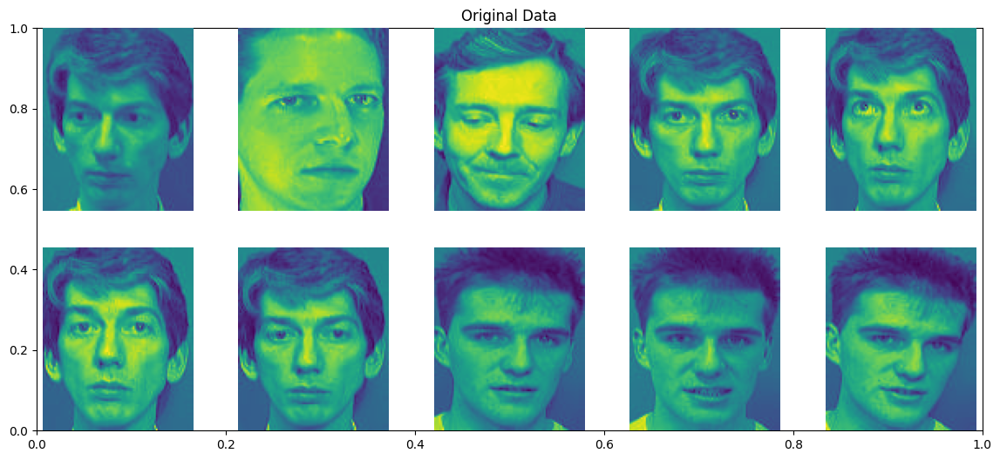

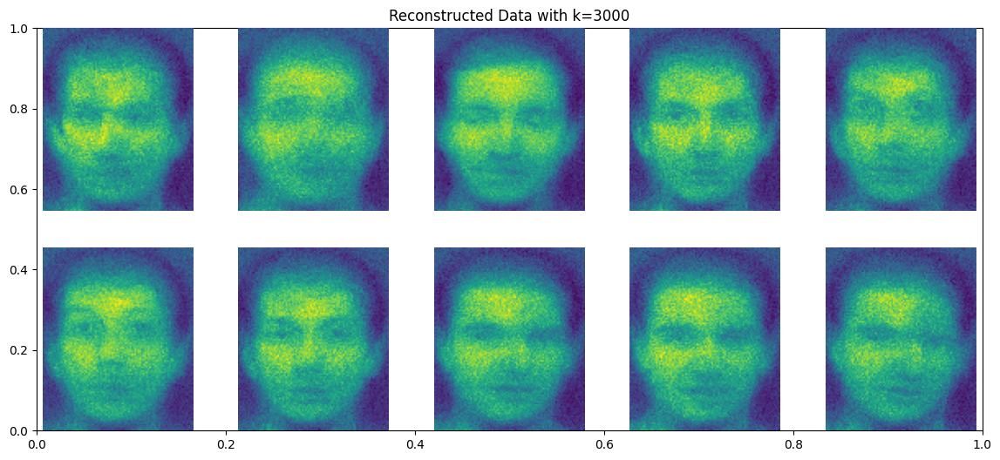

In [181]:
# Projection

proj_data = (eigvec_face_1.T)[:k] @ train_data
reconstructed_data = ((eigvec_face_1.T)[:k].T @ proj_data) + mean_face

num_im_show=10
fig_size=(14,6)

plt.figure(figsize=fig_size)
plt.title('Original Data')
for i in range(num_im_show):
    plt.subplot(2, num_im_show//2, i+1)
    plt.imshow(train_data[:, i+110].reshape(l,b))
    plt.axis('off')
plt.show()

plt.figure(figsize=fig_size)
plt.title(f'Reconstructed Data with k={k}')
for j in range(num_im_show):
    plt.subplot(2, num_im_show//2, j+1)
    plt.imshow(reconstructed_data[:, j+110].reshape(l,b))
    plt.axis('off')
plt.show()

### b)

In [173]:
# Loading test data
test_data=[]

# Loading data from source
for i in os.listdir('face_data/test/'):
    if i!='.ipynb_checkpoints':
        test_data.append(imread('face_data/test/' + i).reshape(-1,1))
        
l, b = imread('face_data/test/' + i).shape


# Converting list to numpy array
test_data=np.array(test_data, dtype=np.float32).squeeze(2).T
# normalising data for pca
test_data/=255

In [186]:
def pca_experiment(eigvec_face_1, test_data, mean_face, K):

    reconstruction_error=[]
    for k in K:
        proj_data_test = (eigvec_face_1.T)[:k] @ test_data
        reconstructed_data_test = ((eigvec_face_1.T)[:k].T @ proj_data_test) + mean_face
        
        num_im_show=10
        fig_size=(14,6)
        
        plt.figure(figsize=fig_size)
        plt.title(f'Original Data with k={k}')
        for i in range(num_im_show):
            plt.subplot(2, num_im_show//2, i+1)
            plt.imshow(test_data[:, i+10].reshape(l,b))
            plt.axis('off')
        plt.show()
        
        plt.figure(figsize=fig_size)
        plt.title(f'Reconstructed Data with k={k}')
        for j in range(num_im_show):
            plt.subplot(2, num_im_show//2, j+1)
            plt.imshow(reconstructed_data_test[:, j+10].reshape(l,b))
            plt.axis('off')
        reconstruction_error.append(((test_data-reconstructed_data_test)**2).mean())
        plt.show()    

    plt.plot(K, reconstruction_error)
    plt.ylabel('Reconstruction Error')
    plt.xlabel('k')
    plt.show()

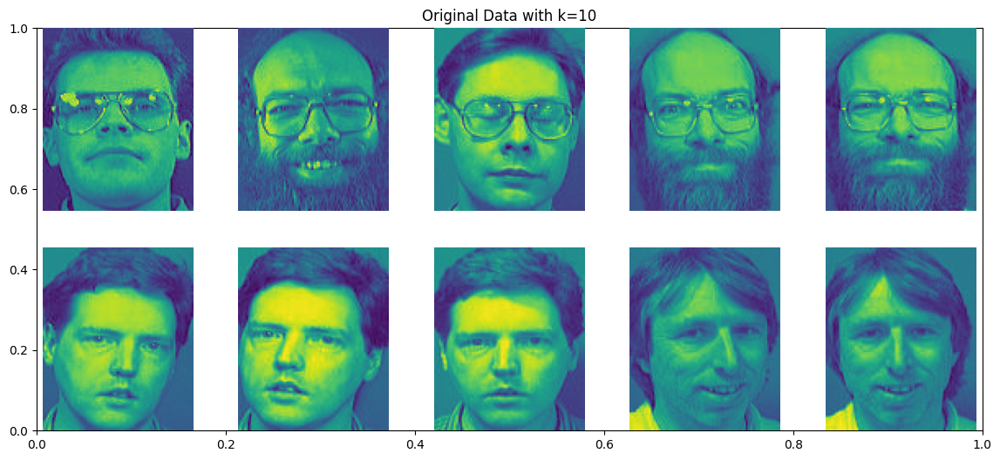

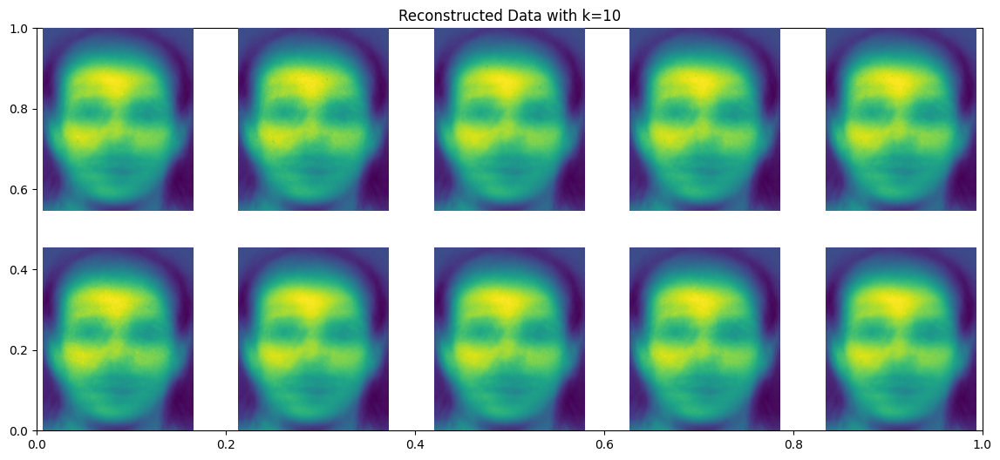

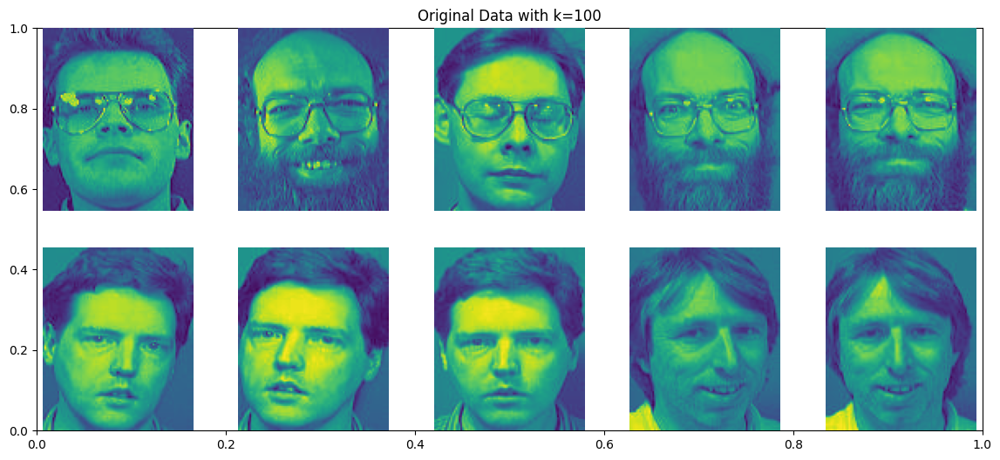

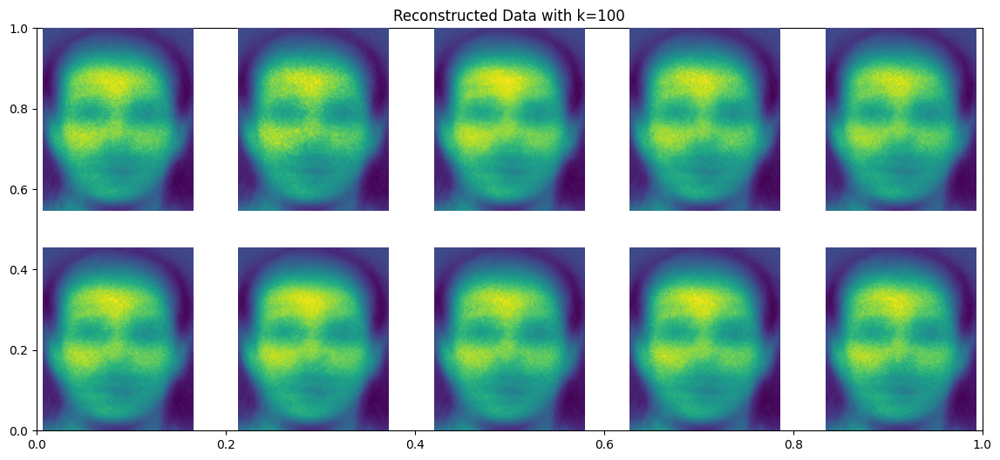

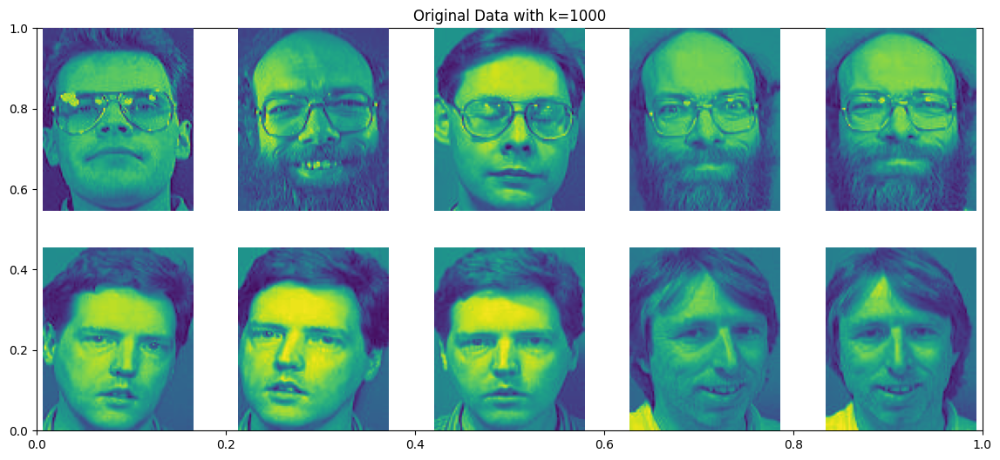

...

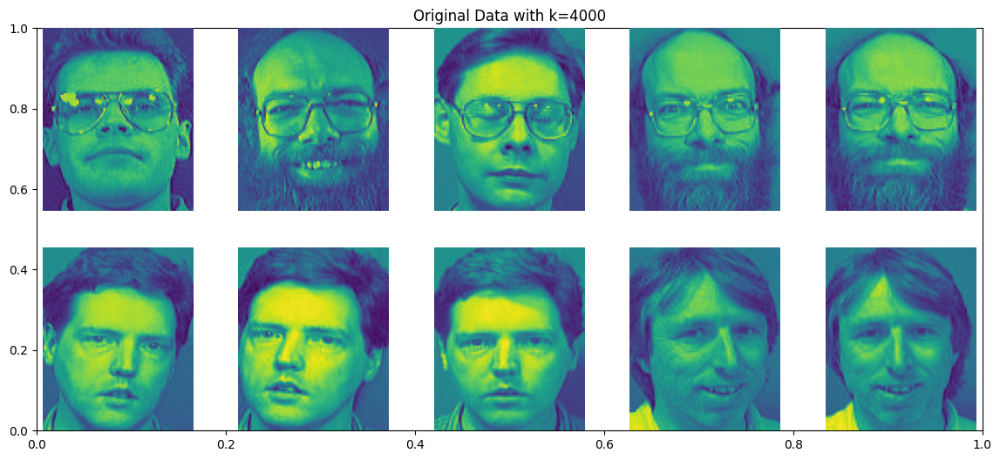

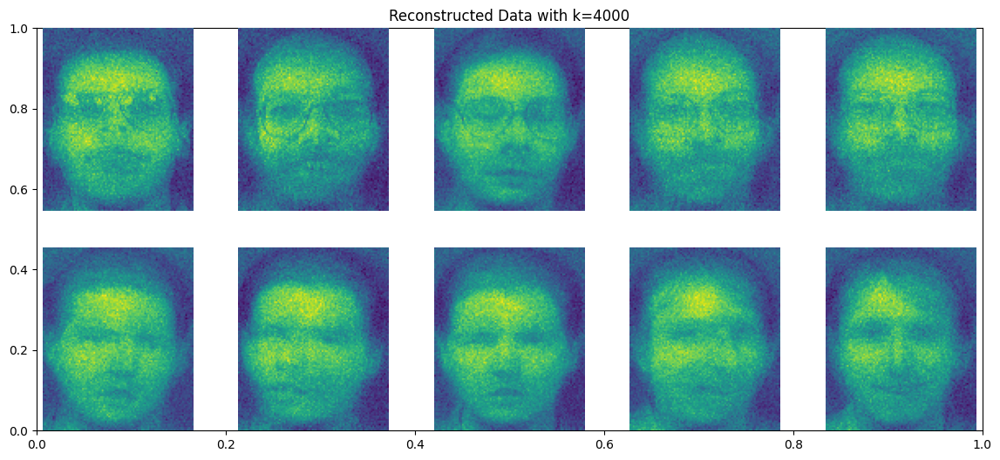

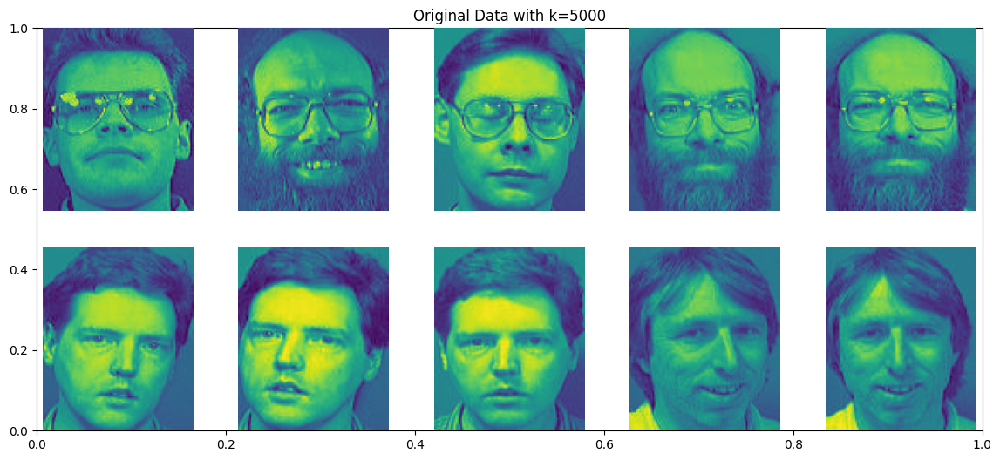

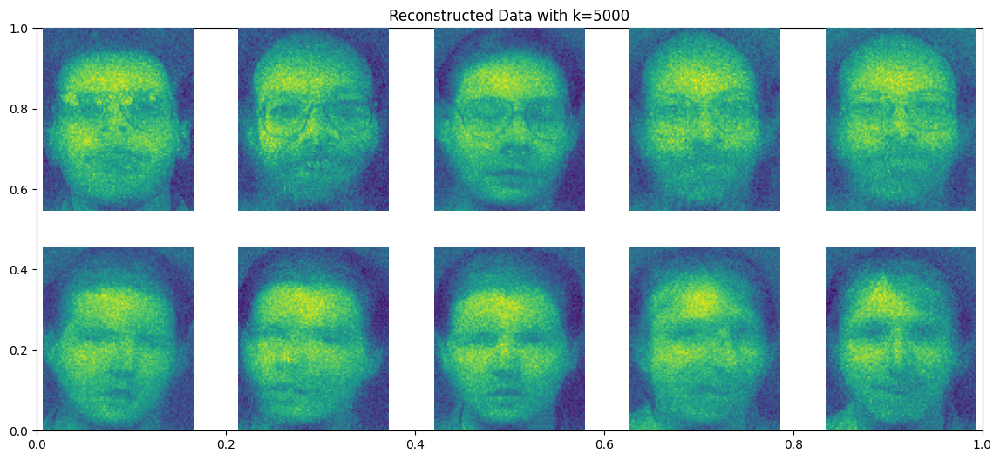

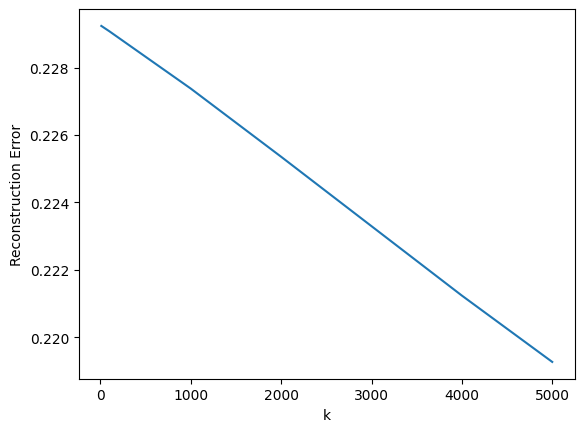

In [187]:
pca_experiment(eigvec_face_1, test_data, mean_face, [10, 100, 1000, 2000, 4000, 5000])

#### Clearly clarity of pictures improves as k increases
#### This can be seen from the reconstruction error going down consistently as k increases

# Question 2

In [2]:
dataset_A = np.array(pd.read_csv('data/dataset_A.csv'))
dataset_B = np.array(pd.read_csv('data/dataset_B.csv'))
dataset_C = np.array(pd.read_csv('data/dataset_C.csv'))

## a) K-Means Clustering

### a) Theoratical Explanation

### Objective Function

The objective function $J$ is the **Within-Cluster Sum of Squares (WCSS)**. We want to find the set of assignments $r_{ik}$ and centroids $\mathbf{\mu}_k$ that minimize this total squared error. The squared Euclidean distance $||\mathbf{x}_i - \mathbf{\mu}_k||^2$ can be expanded as a sum over the $d$ dimensions: $\sum_{j=1}^{d} (x_{ij} - \mu_{kj})^2$.

$$
J = \sum_{i=1}^{N} \sum_{k=1}^{K} r_{ik} \sum_{j=1}^{d} (x_{ij} - \mu_{kj})^2
$$
* $N$: Number of data points
* $K$: Number of clusters
* $d$: Number of dimensions
* $x_{ij}$: The $j$-th feature of the $i$-th data point
* $\mu_{kj}$: The $j$-th feature of the $k$-th centroid
* $r_{ik}$: Binary assignment $\in \{0, 1\}$. $r_{ik} = 1$ if point $i$ is assigned to cluster $k$.

We optimize this using an iterative algorithm, alternating between minimizing $J$ w.r.t. $r_{ik}$ (E-Step) and $\mathbf{\mu}_k$ (M-Step). The algorithm stops when the cluster assignments $r_{ik}$ no longer change, meaning the objective function $J$ has converged to a local minimum.

### E-Step

In this step, we keep the centroids $\mathbf{\mu}_k$ (and all $\mu_{kj}$) fixed and minimize $J$ with respect to the assignments $r_{ik}$.

We can look at the objective function $J$ as a sum over $N$ independent terms, one for each data point $i$:
$$
J = \sum_{i=1}^{N} J_i \quad \text{where} \quad J_i = \sum_{k=1}^{K} r_{ik} \left( \sum_{j=1}^{d} (x_{ij} - \mu_{kj})^2 \right)
$$
We must also satisfy the constraint that each point is assigned to exactly one cluster: $\sum_{k=1}^{K} r_{ik} = 1$ for all $i$.

To minimize $J_i$ for a single point $\mathbf{x}_i$, we need to choose the $k$ for which the distance term $\sum_{j=1}^{d} (x_{ij} - \mu_{kj})^2$ is the smallest. We then set $r_{ik}=1$ for that one minimizing $k$, and $r_{il}=0$ for all other $l \neq k$.

$$
r_{ik} = \begin{cases} 1 & \text{if } k = \arg \min_l \sum_{j=1}^{d} (x_{ij} - \mu_{lj})^2 \\ 0 & \text{otherwise} \end{cases}
$$

### Derivation of the M-Step (Centroid Update Rule)

In this step, we keep the assignments $r_{ik}$ fixed and minimize $J$ with respect to each centroid component $\mu_{kj}$.

The objective function $J$ is separable, meaning we can minimize for each cluster $k$ and each dimension $j$ independently.
$$
J = \sum_{k=1}^{K} \sum_{j=1}^{d} J_{kj} \quad \text{where} \quad J_{kj} = \sum_{i=1}^{N} r_{ik} (x_{ij} - \mu_{kj})^2
$$
$$
\frac{\partial J}{\partial \mu_{kj}} = \frac{\partial}{\partial \mu_{kj}} \left( \sum_{i=1}^{N} r_{ik} (x_{ij} - \mu_{kj})^2 \right)
$$
$$
= \sum_{i=1}^{N} r_{ik} \left[ 2(x_{ij} - \mu_{kj}) \cdot (-1) \right]
$$
$$
= -2 \sum_{i=1}^{N} r_{ik} (x_{ij} - \mu_{kj})
$$
Setting derivative to $0$:
$$
-2 \sum_{i=1}^{N} r_{ik} (x_{ij} - \mu_{kj}) = 0
$$
$$
\sum_{i=1}^{N} r_{ik} x_{ij} - \sum_{i=1}^{N} r_{ik} \mu_{kj} = 0
$$
$$
\sum_{i=1}^{N} r_{ik} x_{ij} = \mu_{kj} \left( \sum_{i=1}^{N} r_{ik} \right)
$$
Let $N_k = \sum_{i=1}^{N} r_{ik}$ be the total count of points in cluster $k$.
$$
\mu_{kj} = \frac{\sum_{i=1}^{N} r_{ik} x_{ij}}{N_k}
$$

The optimal $j$-th component of the centroid $\mu_{kj}$ is the mean (average) of the $j$-th features of all data points $\mathbf{x}_i$ assigned to that cluster. In vector form, this is:
$$
\mathbf{\mu}_k = \frac{1}{N_k} \sum_{i=1}^{N} r_{ik} \mathbf{x}_i
$$

### Time and Space Complexity

* $N$: Number of data points
* $d$: Number of dimensions
* $K$: Number of clusters
* $I$: Number of iterations

**Time Complexity: $O(I \cdot K \cdot N \cdot d)$**
* **E-step:** $O(N \cdot K \cdot d)$. For each of $N$ points, compute $K$ distances. Each distance calculation $\sum_{j=1}^{d}(\dots)^2$ takes $O(d)$.
* **M-step:** $O(N \cdot d)$. Sum all $N$ points (each $O(d)$) into their respective cluster sums.
* **Total:** $O(I \cdot (NKd + Nd)) \approx O(I \cdot K \cdot N \cdot d)$.

**Space Complexity: $O(N \cdot d + K \cdot d)$**
* $O(N \cdot d)$: To store the dataset $\mathbf{X}$.
* $O(K \cdot d)$: To store the $K$ centroids $\mathbf{\mu}_k$.

### Limitations

* **Cluster Shapes:** Assumes clusters are **spherical** and convex. Fails on elongated or non-convex (like U-shaped) clusters.
* **Cluster Sizes:** Assumes clusters have similar **variances (sizes)**. Struggles with clusters of different densities or radii.

### b) Code

In [99]:
def k_means(data_matrix, k):
    rng = np.random.RandomState(None)
    indices = rng.choice(data_matrix.shape[0], k, replace=False)
    centroids = data_matrix[indices]

    clusters_index_old = []
    while True:
        clusters = np.argmin(((data_matrix[None,:,:]-centroids[:,None,:])**2).sum(axis=2), axis=0)
        clusters_index = [np.where(clusters==i)[0] for i in range(k) if np.where(clusters==i)[0].size != 0]
        
        l=[]
        for i in range(len(clusters_index)):
            l.append(data_matrix[clusters_index[i]].mean(axis=0))
        centroids = np.array(l)
        
        if len(clusters_index_old) == 0:
            clusters_index_old = clusters_index
        else:
            sum=0
            
            if len(clusters_index) != len(clusters_index_old):
                sum = -1
            else:
                for i in range(len(clusters_index_old)):
                    if clusters_index[i].shape[0] != clusters_index_old[i].shape[0]:
                        sum=-1
                        break
                    else:
                        sum+=((clusters_index[i] != clusters_index_old[i]).sum())
            
            if sum == 0:
                break
        
        clusters_index_old = clusters_index

    wcss = 0
    for i in range(len(clusters_index_old)):
        points = data_matrix[clusters_index_old[i]]
        center = centroids[i]
        wcss += np.sum((points - center)**2)

    return clusters_index_old, centroids, wcss

In [97]:
def plot_kmeans(x, clusters_index, centroids, wcss, title):
    
    plt.figure(figsize=(8, 6))
    x_min, x_max = x[:, 0].min() - 1, x[:, 0].max() + 1
    y_min, y_max = x[:, 1].min() - 1, x[:, 1].max() + 1
    
    # step size for mesh
    h = 0.05 
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    mesh_points = np.c_[xx.ravel(), yy.ravel()]

    dis = np.sum((mesh_points[:, None, :]-centroids[None, :, :])**2, axis=2)
    z = np.argmin(dis, axis=1)
    z = z.reshape(xx.shape)

    plt.contourf(xx, yy, z, alpha=0.6)
    plt.contour(xx, yy, z, alpha=0.5)

    colors = plt.cm.tab10(np.linspace(0, 1, len(clusters_index)))
    
    for i in range(len(clusters_index)):
        indices = clusters_index[i]
        cluster_points = x[indices]
        plt.scatter(cluster_points[:, 0], cluster_points[:, 1], color=colors[i], s=30, label=f'Cluster {i}')

    plt.scatter(centroids[:, 0], centroids[:, 1], c='red', marker='x', s=100, label='Centroids')
    
    plt.xlabel("x")
    plt.ylabel("y")
    plt.title(title)
    plt.legend()
    plt.show()

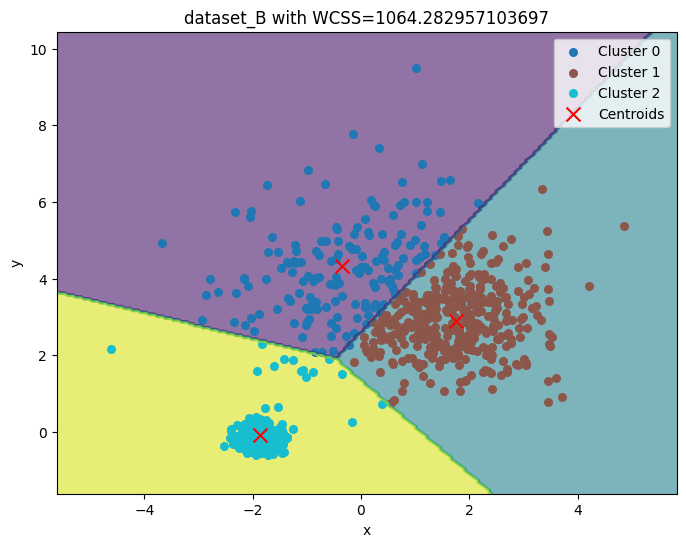

In [106]:
clusters_index_B, centroids_B, wcss_B = k_means(dataset_B, k=3)
plot_kmeans(dataset_B, clusters_index_B, centroids_B, wcss_B, f'dataset_B with WCSS={wcss_B}')

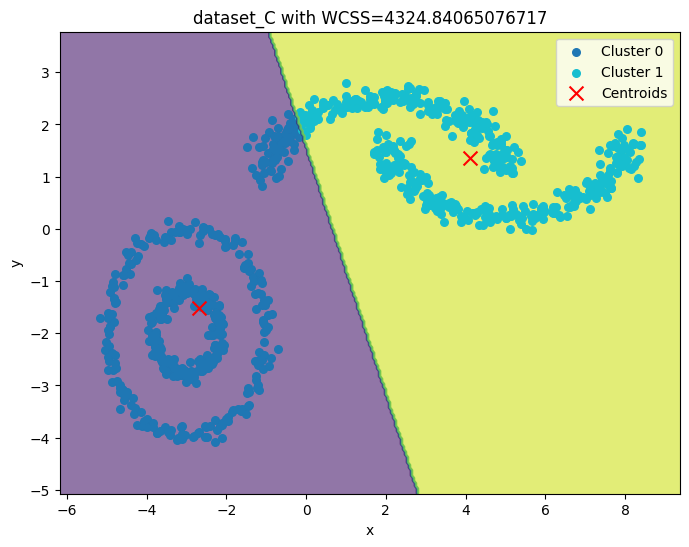

In [123]:
clusters_index_C, centroids_C, wcss_C = k_means(dataset_C, k=2)
plot_kmeans(dataset_C, clusters_index_C, centroids_C, wcss_C, f'dataset_C with WCSS={wcss_C}')

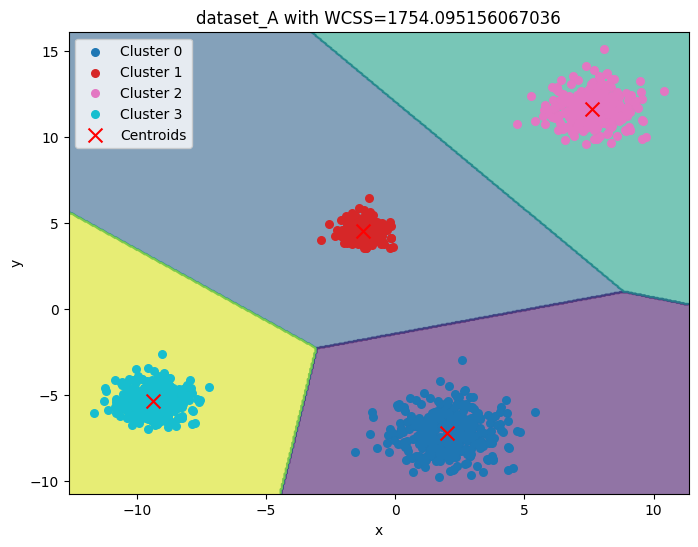

In [109]:
clusters_index_A, centroids_A, wcss_A = k_means(dataset_A, k=4)
plot_kmeans(dataset_A, clusters_index_A, centroids_A, wcss_A, f'dataset_A with WCSS={wcss_A}')

## b) GMM

### a) Theoratical Explanation














In GMM, we assume the data $\mathbf{X}$ is generated from a mixture of $K$ Gaussian components.
We introduce a latent variable $\mathbf{Z}$, where $z_{ik} \in \{0, 1\}$ is a binary indicator that is $1$ if point $\mathbf{x}_i$ was generated by component $k$, and $0$ otherwise.

The parameters of the model are $\mathbf{\theta} = \{ \pi_k, \mathbf{\mu}_k, \mathbf{\Sigma}_k \text{ for } k=1...K \}$:
* $\pi_k$: $P(z_{ik}=1)$, the prior probability of component $k$.
* $\mathbf{\mu}_k$: Mean vector of component $k$ $(d \times 1)$.
* $\mathbf{\Sigma}_k$: Covariance matrix of component $k$ $(d \times d)$.

The **complete data likelihood** is the joint probability of the observed data $\mathbf{X}$ and the latent assignments $\mathbf{Z}$, given the parameters $\mathbf{\theta}$. Assuming data points are i.i.d.:
$$
P(\mathbf{X}, \mathbf{Z} | \mathbf{\theta}) = \prod_{i=1}^{N} P(\mathbf{x}_i, \mathbf{z}_i | \mathbf{\theta})
$$
We can write $P(\mathbf{x}_i, \mathbf{z}_i) = P(\mathbf{x}_i | \mathbf{z}_i) P(\mathbf{z}_i)$.
1.  $P(\mathbf{z}_i | \mathbf{\theta})$: The probability of a specific assignment $\mathbf{z}_i$. Since $z_{ik}$ is 1 for only one $k$:
    $$
    P(\mathbf{z}_i | \mathbf{\theta}) = \prod_{k=1}^{K} (\pi_k)^{z_{ik}}
    $$
2.  $P(\mathbf{x}_i | \mathbf{z}_i, \mathbf{\theta})$: The probability of $\mathbf{x}_i$ given it came from a specific component.
    $$
    P(\mathbf{x}_i | \mathbf{z}_i, \mathbf{\theta}) = \prod_{k=1}^{K} \left[ \mathcal{N}(\mathbf{x}_i | \mathbf{\mu}_k, \mathbf{\Sigma}_k) \right]^{z_{ik}}
    $$
    where $\mathcal{N}(\dots)$ is the Gaussian PDF.

Combining these:
$$
P(\mathbf{X}, \mathbf{Z} | \mathbf{\theta}) = \prod_{i=1}^{N} \left[ \prod_{k=1}^{K} (\pi_k)^{z_{ik}} \cdot \prod_{k=1}^{K} \mathcal{N}(\mathbf{x}_i | \mathbf{\mu}_k, \mathbf{\Sigma}_k)^{z_{ik}} \right]
$$
$$
P(\mathbf{X}, \mathbf{Z} | \mathbf{\theta}) = \prod_{i=1}^{N} \prod_{k=1}^{K} \left[ \pi_k \mathcal{N}(\mathbf{x}_i | \mathbf{\mu}_k, \mathbf{\Sigma}_k) \right]^{z_{ik}}
$$
The **complete data log-likelihood** $\mathcal{L}(\mathbf{\theta}) = \log P(\mathbf{X}, \mathbf{Z} | \mathbf{\theta})$ is:
$$
\mathcal{L}(\mathbf{\theta}) = \sum_{i=1}^{N} \sum_{k=1}^{K} z_{ik} \left( \log \pi_k + \log \mathcal{N}(\mathbf{x}_i | \mathbf{\mu}_k, \mathbf{\Sigma}_k) \right)
$$
This is the function we *want* to maximize, but we cannot do this directly as $\mathbf{Z}$ is unknown.

### EM Algorithm

We maximize the *expectation* of the complete data log-likelihood, $Q(\mathbf{\theta}, \mathbf{\theta}^{\text{old}})$, taken over the posterior distribution of $\mathbf{Z}$.

$$
Q(\mathbf{\theta}, \mathbf{\theta}^{\text{old}}) = E_{\mathbf{Z} | \mathbf{X}, \mathbf{\theta}^{\text{old}}} \left[ \mathcal{L}(\mathbf{\theta}) \right]
$$
$$
= E_{\mathbf{Z}} \left[ \sum_{i=1}^{N} \sum_{k=1}^{K} z_{ik} \left( \log \pi_k + \log \mathcal{N}(\mathbf{x}_i | \mathbf{\mu}_k, \mathbf{\Sigma}_k) \right) \right]
$$
Since the terms $(\log \pi_k + \log \mathcal{N}(\dots))$ are independent w.r.t. $\mathbf{Z}$, the expectation only applies to $z_{ik}$:
$$
= \sum_{i=1}^{N} \sum_{k=1}^{K} E_{\mathbf{Z}}[z_{ik}] \left( \log \pi_k + \log \mathcal{N}(\mathbf{x}_i | \mathbf{\mu}_k, \mathbf{\Sigma}_k) \right)
$$
The only term we need to compute is $E_{\mathbf{Z}}[z_{ik}]$, which is the **responsibility**, $\gamma(z_{ik})$.

#### **E-Step: Computing Responsibilities**
$E[z_{ik}]$ is obtained from Bayes' theorem:
$$
\gamma(z_{ik}) = E[z_{ik}] = P(z_{ik}=1 | \mathbf{x}_i, \mathbf{\theta}^{\text{old}})
$$
$$
= \frac{P(z_{ik}=1) P(\mathbf{x}_i | z_{ik}=1)}{\sum_{j=1}^{K} P(z_{ij}=1) P(\mathbf{x}_i | z_{ij}=1)}
$$
$$
\gamma(z_{ik}) = \frac{\pi_k \mathcal{N}(\mathbf{x}_i | \mathbf{\mu}_k, \mathbf{\Sigma}_k)}{\sum_{j=1}^{K} \pi_j \mathcal{N}(\mathbf{x}_i | \mathbf{\mu}_j, \mathbf{\Sigma}_j)}
$$
* This step computes the "soft assignments" $\gamma(z_{ik})$ for all $N \cdot K$ pairs.

#### **M-Step: Maximizing $Q$ w.r.t. $\mathbf{\theta}$**

We now maximize $Q$ by substituting $E[z_{ik}]$ with $\gamma(z_{ik})$ and taking derivatives w.r.t. each parameter and setting them to zero.

Let $N_k = \sum_{i=1}^{N} \gamma(z_{ik})$

1.  **Derivation for $\mathbf{\mu}_k$:** (Maximize w.r.t. $\mathbf{\mu}_k$)
    The relevant part of $Q$ is $\sum_{i=1}^{N} \gamma(z_{ik}) \log \mathcal{N}(\mathbf{x}_i | \mathbf{\mu}_k, \mathbf{\Sigma}_k)$.
    $$
    \frac{\partial Q}{\partial \mathbf{\mu}_k} = \frac{\partial}{\partial \mathbf{\mu}_k} \sum_{i=1}^{N} \gamma(z_{ik}) \left( C - \frac{1}{2} (\mathbf{x}_i - \mathbf{\mu}_k)^T \mathbf{\Sigma}_k^{-1} (\mathbf{x}_i - \mathbf{\mu}_k) \right)
    $$
    $$
    = \sum_{i=1}^{N} \gamma(z_{ik}) \left( - \frac{1}{2} \cdot -2 \mathbf{\Sigma}_k^{-1} (\mathbf{x}_i - \mathbf{\mu}_k) \right)
    $$
    $$
    = \mathbf{\Sigma}_k^{-1} \sum_{i=1}^{N} \gamma(z_{ik}) (\mathbf{x}_i - \mathbf{\mu}_k)
    $$
    Setting to $\mathbf{0}$ and multiplying by $\mathbf{\Sigma}_k$:
    $$
    \sum_{i=1}^{N} \gamma(z_{ik}) (\mathbf{x}_i - \mathbf{\mu}_k) = \mathbf{0} \implies \sum_{i=1}^{N} \gamma(z_{ik}) \mathbf{x}_i = \left( \sum_{i=1}^{N} \gamma(z_{ik}) \right) \mathbf{\mu}_k
    $$
    $$
    \mathbf{\mu}_k^{\text{new}} = \frac{1}{N_k} \sum_{i=1}^{N} \gamma(z_{ik}) \mathbf{x}_i
    $$

2.  **Derivation for $\mathbf{\Sigma}_k$:** (Maximize w.r.t. $\mathbf{\Sigma}_k$)
    We maximize the part of $Q$ that depends on $\mathbf{\Sigma}_k$:
    $$
    Q_{\Sigma_k} = \sum_{i=1}^{N} \gamma(z_{ik}) \log \mathcal{N}(\mathbf{x}_i | \mathbf{\mu}_k, \mathbf{\Sigma}_k)
    $$
    The log-likelihood of a $d$-dimensional Gaussian is:
    $$
    \log \mathcal{N}(\mathbf{x}_i | \mathbf{\mu}_k, \mathbf{\Sigma}_k) = C - \frac{1}{2}\log|\mathbf{\Sigma}_k| - \frac{1}{2}(\mathbf{x}_i - \mathbf{\mu}_k)^T \mathbf{\Sigma}_k^{-1} (\mathbf{x}_i - \mathbf{\mu}_k)
    $$
    $$
    Q_{\Sigma_k} = C' - \frac{1}{2} \sum_{i=1}^{N} \gamma(z_{ik}) \left( \log|\mathbf{\Sigma}_k| + (\mathbf{x}_i - \mathbf{\mu}_k)^T \mathbf{\Sigma}_k^{-1} (\mathbf{x}_i - \mathbf{\mu}_k) \right)
    $$
    Let $\mathbf{A} = \mathbf{\Sigma}_k^{-1}$.
    We use the trace property $\text{tr}(\text{scalar}) = \text{scalar}$. Since $(\mathbf{x}_i - \mathbf{\mu}_k)^T \mathbf{A} (\mathbf{x}_i - \mathbf{\mu}_k)$ is a scalar, we can write:
    $$
    (\mathbf{x}_i - \mathbf{\mu}_k)^T \mathbf{A} (\mathbf{x}_i - \mathbf{\mu}_k) = \text{tr} \left( (\mathbf{x}_i - \mathbf{\mu}_k)^T \mathbf{A} (\mathbf{x}_i - \mathbf{\mu}_k) \right)
    $$
    Using the cyclic property $\text{tr}(\mathbf{ABC}) = \text{tr}(\mathbf{CAB})$:
    $$
    = \text{tr} \left( (\mathbf{x}_i - \mathbf{\mu}_k) (\mathbf{x}_i - \mathbf{\mu}_k)^T \mathbf{A} \right)
    $$
    Now, substitute this back into $Q_{\Sigma_k}$ (and use $\log|\mathbf{\Sigma}_k| = \log|\mathbf{A}^{-1}| = -\log|\mathbf{A}|$):
    $$
    Q_{\Sigma_k} = C' - \frac{1}{2} \sum_{i=1}^{N} \gamma(z_{ik}) \left( -\log|\mathbf{A}| + \text{tr} \left( (\mathbf{x}_i - \mathbf{\mu}_k)(\mathbf{x}_i - \mathbf{\mu}_k)^T \mathbf{A} \right) \right)
    $$
    Now, take the derivative w.r.t. $\mathbf{A}$ (using $\frac{\partial \log|\mathbf{A}|}{\partial \mathbf{A}} = (\mathbf{A}^{-1})^T$ and $\frac{\partial \text{tr}(\mathbf{B} \mathbf{A})}{\partial \mathbf{A}} = \mathbf{B}^T$):
    $$
    \frac{\partial Q_{\Sigma_k}}{\partial \mathbf{A}} = - \frac{1}{2} \sum_{i=1}^{N} \gamma(z_{ik}) \left( -(\mathbf{A}^{-1})^T + \left( (\mathbf{x}_i - \mathbf{\mu}_k)(\mathbf{x}_i - \mathbf{\mu}_k)^T \right)^T \right)
    $$
    Assuming $\mathbf{A}$ is symmetric (as $\mathbf{\Sigma}_k$ is), $\mathbf{A}^{-1} = \mathbf{\Sigma}_k$ is also symmetric, so $(\mathbf{A}^{-1})^T = \mathbf{\Sigma}_k$.
    $$
    \frac{\partial Q_{\Sigma_k}}{\partial \mathbf{A}} = - \frac{1}{2} \sum_{i=1}^{N} \gamma(z_{ik}) \left( -\mathbf{\Sigma}_k + (\mathbf{x}_i - \mathbf{\mu}_k)(\mathbf{x}_i - \mathbf{\mu}_k)^T \right)
    $$
    Setting derivative to $\mathbf{0}$:
    $$
    \sum_{i=1}^{N} \gamma(z_{ik}) \left( -\mathbf{\Sigma}_k + (\mathbf{x}_i - \mathbf{\mu}_k)(\mathbf{x}_i - \mathbf{\mu}_k)^T \right) = \mathbf{0}
    $$
    $$
    \sum_{i=1}^{N} \gamma(z_{ik}) \mathbf{\Sigma}_k = \sum_{i=1}^{N} \gamma(z_{ik}) (\mathbf{x}_i - \mathbf{\mu}_k)(\mathbf{x}_i - \mathbf{\mu}_k)^T
    $$
    $$
    \left( \sum_{i=1}^{N} \gamma(z_{ik}) \right) \mathbf{\Sigma}_k = \sum_{i=1}^{N} \gamma(z_{ik}) (\mathbf{x}_i - \mathbf{\mu}_k)(\mathbf{x}_i - \mathbf{\mu}_k)^T
    $$
    $$
    N_k \mathbf{\Sigma}_k = \sum_{i=1}^{N} \gamma(z_{ik}) (\mathbf{x}_i - \mathbf{\mu}_k)(\mathbf{x}_i - \mathbf{\mu}_k)^T
    $$
    (Using $\mathbf{\mu}_k = \mathbf{\mu}_k^{\text{new}}$ from the same M-step)
    $$
    \mathbf{\Sigma}_k^{\text{new}} = \frac{1}{N_k} \sum_{i=1}^{N} \gamma(z_{ik}) (\mathbf{x}_i - \mathbf{\mu}_k^{\text{new}}) (\mathbf{x}_i - \mathbf{\mu}_k^{\text{new}})^T
    $$

3.  **Derivation for $\pi_k$:** Maximizing w.r.t. $\pi_k$ with constraint $\sum_k \pi_k = 1$ using Lagrange multiplier $\lambda$:
    $$
    \mathcal{L}_{\pi} = \sum_{i=1}^{N} \sum_{k=1}^{K} \gamma(z_{ik}) \log \pi_k + \lambda \left( \sum_{k=1}^{K} \pi_k - 1 \right)
    $$
    $$
    \frac{\partial \mathcal{L}_{\pi}}{\partial \pi_k} = \sum_{i=1}^{N} \frac{\gamma(z_{ik})}{\pi_k} + \lambda = 0 \implies \frac{N_k}{\pi_k} = -\lambda \implies \pi_k = -\frac{N_k}{\lambda}
    $$
    Sum over $k$: $\sum_k \pi_k = 1 = \sum_k -\frac{N_k}{\lambda} \implies 1 = -\frac{N}{\lambda} \implies \lambda = -N$.
    Substitute back: $\pi_k = - \frac{N_k}{-N} = \frac{N_k}{N}$.
    $$
    \pi_k^{\text{new}} = \frac{N_k}{N}
    $$

### 3. Soft Assignments vs. Hard Assignments

* **Hard Assignments (K-Means):**
    Each data point $\mathbf{x}_i$ is assigned to **exactly one** cluster. The assignment $r_{ik}$ is **binary** ($r_{ik} \in \{0, 1\}$). A point is either 100% in cluster A or 0% in cluster A. This creates hard, distinct boundaries.

* **Soft Assignments (GMM):**
    Each data point $\mathbf{x}_i$ has a **probabilistic** assignment to *all* clusters. The responsibility $\gamma(z_{ik})$ is a **real-valued number** between 0 and 1, representing the posterior probability $P(z_{ik}=1 | \mathbf{x}_i)$.
    * Example: A point on the boundary might be $\gamma(z_{i,A}) = 0.5$ and $\gamma(z_{i,B}) = 0.5$.
    * This allows GMM to model overlapping clusters and express uncertainty.
    * In the M-step, a point's contribution to a cluster's new parameters is *weighted* by its responsibility (e.g., it contributes 50% to $\mathbf{\mu}_A$ and 50% to $\mathbf{\mu}_B$).

### b) Code

In [3]:
def multivariate_gaussian_mine(x, mu, cov):
    det_cov = np.linalg.det(cov)
    inv_cov = np.linalg.inv(cov)
    
    # Constant part
    norm_const = 1/(np.power(2*np.pi, x.shape[1]/2)*(det_cov**0.5))
    diff = x - mu.reshape(1, x.shape[1])
    
    return norm_const * np.exp(-0.5*np.diag(diff@np.linalg.inv(cov)@diff.T))

In [158]:
def gmm(x, K, max_iters):

    # Initializing mean randomly with data points
    rng = np.random.RandomState(None)
    random_indices = rng.choice(x.shape[0], K, replace=False)
    mu = x[random_indices] 
    
    sigma = np.array([np.eye(x.shape[1]) for i in range(K)])
    pi = np.ones(K) / K
    gamma = np.zeros((x.shape[0], K))
    log_likelihoods = []

    for iteration in range(max_iters):

        # E Step
        for k in range(K):
            likelihood = multivariate_gaussian_mine(x, mu[k], sigma[k])
            gamma[:, k] = pi[k] * likelihood
            
        # Adding small epsilon to avoid division by zero error

        denom = gamma.sum(axis=1, keepdims=True)
        cur_log_likelihood = np.sum(np.log(denom))
        log_likelihoods.append(cur_log_likelihood)
        gamma /= (denom + 1e-10)
        
        # M Step
        Nk = np.sum(gamma, axis=0)
        for k in range(K):
            weighted_sum_x = np.sum(gamma[:, k].reshape(-1, 1) * x, axis=0)
            
            mu[k] = weighted_sum_x / Nk[k]
 
            weighted_sum_sigma = np.zeros((x.shape[1], x.shape[1]))
            for i in range(x.shape[0]):
                diff = (x[i] - mu[k]).reshape(-1, 1)
                outer_prod = (diff@diff.T)
                weighted_sum_sigma += gamma[i, k] * outer_prod
            sigma[k] = weighted_sum_sigma / Nk[k]
            
            # Add small regularization to diagonal so matrix stays invertible
            # sigma[k] += np.eye(x.shape[1]) * 1e-6
            
            pi[k] = Nk[k] / x.shape[0]
            
    return mu, sigma, pi, gamma, log_likelihoods

In [125]:
def plot_gmm(X, mu, Sigma, pi, gamma, title):

    cluster_assignments = np.argmax(gamma, axis=1)
    plt.figure(figsize=(8, 6))
    
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
    grid_points = np.c_[xx.ravel(), yy.ravel()]
    
    z = np.zeros(grid_points.shape[0])
    for k in range(len(pi)):
        probs = multivariate_gaussian_mine(grid_points, mu[k], Sigma[k])
        z += pi[k] * probs
    z = z.reshape(xx.shape)
    
    plt.contour(xx, yy, z, alpha=0.5)
    plt.scatter(X[:, 0], X[:, 1], c=cluster_assignments, alpha=0.8)
    plt.scatter(mu[:, 0], mu[:, 1], c='red', marker='X', s=100, label='centroids')
    
    plt.xlabel("x")
    plt.ylabel("y")
    plt.title(title)
    plt.legend()
    plt.show()

In [77]:
def plot_convergence(log_likelihoods):
    plt.figure(figsize=(8, 4))
    plt.plot(log_likelihoods, linestyle='-')
    plt.xlabel("Iteration")
    plt.ylabel("Log-Likelihood")
    plt.show()

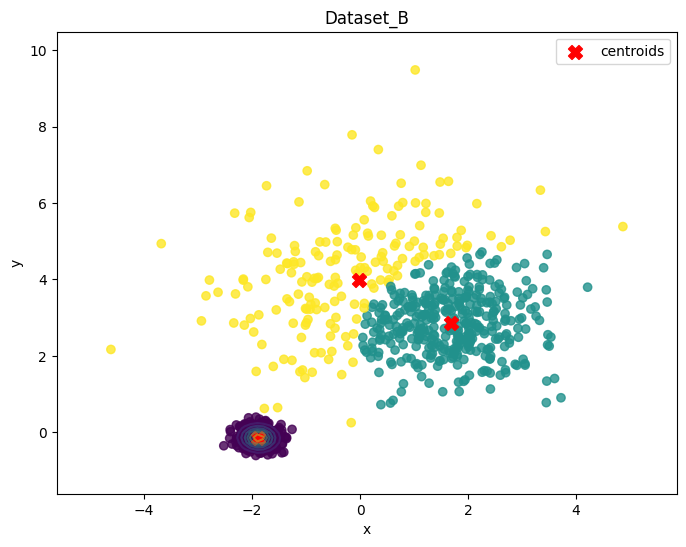

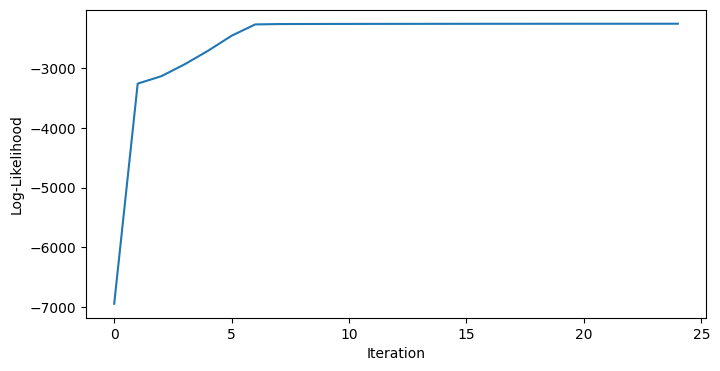

In [150]:
k_B=3

mu_B, sigma_B, pi_B, gamma_B, log_likelihoods_B = gmm(dataset_B, k_B, max_iters=25)
plot_gmm(dataset_B, mu_B, sigma_B, pi_B, gamma_B, title='Dataset_B')
plot_convergence(log_likelihoods_B)

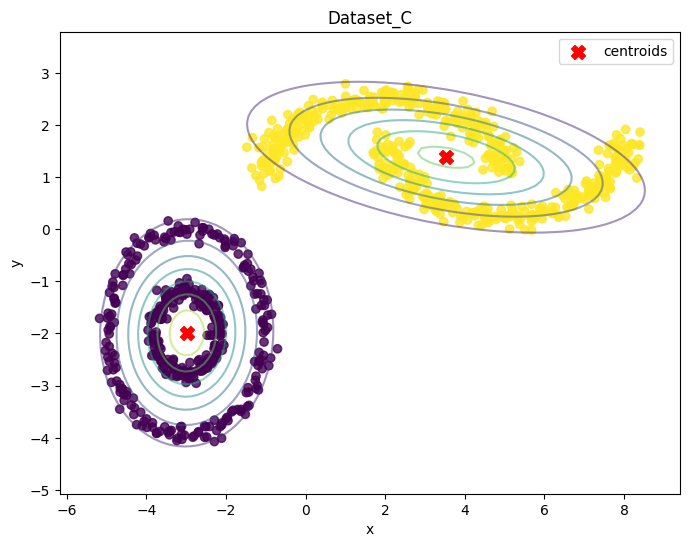

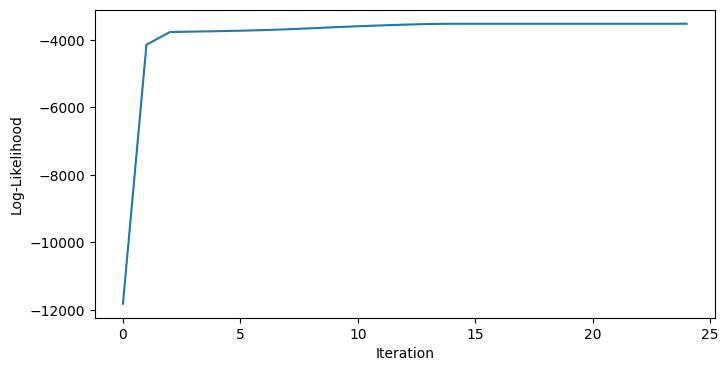

In [128]:
k_C= 2
mu_C, sigma_C, pi_C, gamma_C, log_likelihoods_C = gmm(dataset_C, k_C, max_iters=25)
plot_gmm(dataset_C, mu_C, sigma_C, pi_C, gamma_C, title='Dataset_C')
plot_convergence(log_likelihoods_C)

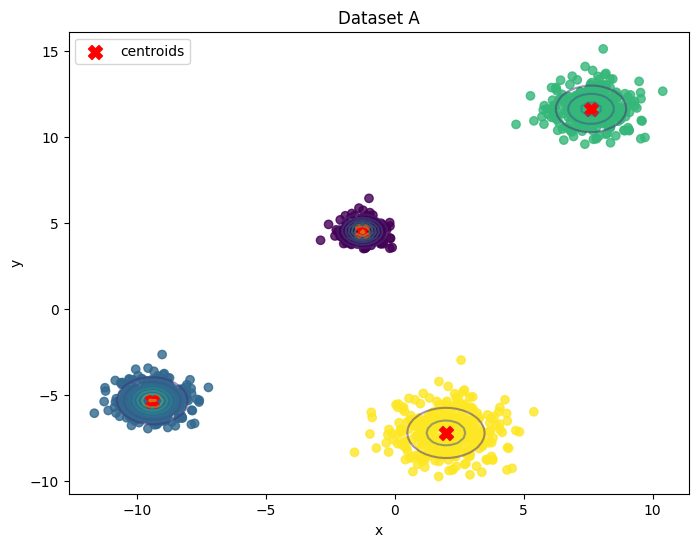

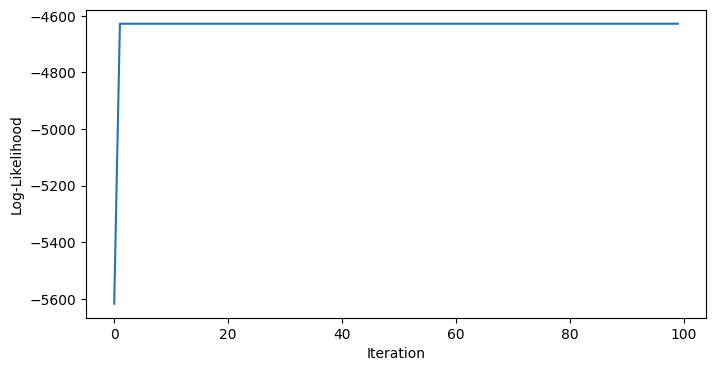

In [190]:
k_A=4
mu_A, sigma_A, pi_A, gamma_A, log_likelihoods_A = gmm(dataset_A, k_A, max_iters=100)
plot_gmm(dataset_A, mu_A, sigma_A, pi_A, gamma_A, title='Dataset A')
plot_convergence(log_likelihoods_A)

#### K Means performed very closely with GMMs
#### They show difference mostly only near decision boundaries due to probabilistic assignemnt of GMMs
#### For Dataset A, 4 clusters are visible. K means is able to classify them almost accurately, while GMMs vary in classification 
#### This can be due to probabilistic nature of steps in GMMs
#### For remaining datasets, both perform very similar